# Primary Analyses

## Criteria for grading:

#There is a Jupyter notebook that thoroughly describes the data extraction, cleaning, and 
#transformation process, and the cleaned data is exported as CSV files for the machine learning model. (10 points)

#A Python script initializes, trains, and evaluates a model or loads a pretrained model. (10 points)

#The model demonstrates meaningful predictive power at least 75% classification accuracy or 0.80 R-squared. (5 points)



# Data Implementation:  Data Cleaning and Preparation

## Data Cleaning and Preparation is necessary so that we can access our data and implement a functional dataframe for our coding during later stages of Data Implementation and during Data Model Evaluation and Optimization. 

This stage of Data Implementation includes feature selection from the ATP questionnaire, detecting and erasing null values, detecting and erasing duplicate entires, and recoding features so that results from analyses are interpretable. A Data Key was generated during this phase to document feature and feature characteristics and guide later coding and interpretation.   

This version of the dataframe does not have EVCAR2B (i.e., "How much of a reason is each of the following for why you would consider purchasing and electric vehicle?") as only respondents who indicated they were very likely to purchase an EV were asked EVCAR2B, thereby greatly reducing our sample size.    

In [2]:
#Setup dependencies and create encoder and standardscaler instances for all Data Implementation stages

import pandas as pd
import numpy as np
import scipy.stats as stats

import matplotlib.pyplot as plt
%matplotlib inline
import pydotplus
import seaborn as sns
import graphviz


from sklearn.preprocessing import OneHotEncoder
encoder = OneHotEncoder(sparse=False) 

# from sklearn.linear_model import LinearRegression
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.model_selection import RandomizedSearchCV
# from sklearn.datasets import make_regression
from scipy.stats import shapiro
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import LeaveOneOut
from sklearn import tree
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC 

from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from sklearn.metrics import accuracy_score
from sklearn.metrics import balanced_accuracy_score
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix
from sklearn.metrics import ConfusionMatrixDisplay
from sklearn.metrics import roc_curve, auc, roc_auc_score
from sklearn.metrics import RocCurveDisplay


from IPython.display import Image









In [3]:
#This is to turn on and off depending on whether you want to see warnings or not.
import warnings
warnings.filterwarnings('ignore')

In [4]:
path ='../Data/'

In [5]:
# reading csv file
EV_df_original_1B = pd.read_csv(path+'ATP_108_Original_csv')
# displaying info on dataframe
EV_df_original_1B.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10282 entries, 0 to 10281
Data columns (total 39 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   QKEY                 10282 non-null  int64  
 1   ENV2_a_W108          10282 non-null  int64  
 2   ENV2_b_W108          10282 non-null  int64  
 3   ENV2_d_W108          10282 non-null  int64  
 4   ENV2_f_W108          10282 non-null  int64  
 5   EN1_W108             10282 non-null  int64  
 6   EVCAR2_W108          10282 non-null  int64  
 7   EVCAR3_W108          10282 non-null  int64  
 8   EVCAR1_W108          10282 non-null  int64  
 9   ENVIR8_a_W108        10282 non-null  int64  
 10  ENVIR8_e_W108        10282 non-null  int64  
 11  LOCENV_a_W108        10282 non-null  int64  
 12  LOCENV_d_W108        10282 non-null  int64  
 13  LOCENV_e_W108        10282 non-null  int64  
 14  ENVRMPCT_a_W108      10282 non-null  int64  
 15  ENVRMPCT_b_W108      10282 non-null 

In [6]:
# look at data frame
EV_df_original_1B.head()

,QKEY,ENV2_a_W108,ENV2_b_W108,ENV2_d_W108,ENV2_f_W108,EN1_W108,EVCAR2_W108,EVCAR3_W108,EVCAR1_W108,ENVIR8_a_W108,...,F_METRO,F_CREGION,F_AGECAT,F_GENDER,F_EDUCCAT,F_RACETHNMOD,F_PARTYSUM_FINAL,F_INC_SDT1,F_IDEO,F_INTFREQ
0,100260,1,1,2,2,2,2,2,2,2,...,1,4,4,1,1,1,1,4,1,2.0
1,100314,2,1,1,1,1,2,1,2,2,...,2,2,4,1,2,1,1,3,4,2.0
2,100363,1,1,1,1,1,2,2,2,2,...,1,1,2,2,1,1,2,9,3,2.0
3,100598,2,2,1,1,1,2,1,2,2,...,1,4,3,2,1,1,1,9,2,2.0
4,100637,1,1,1,1,2,3,2,2,1,...,1,3,4,2,2,1,1,2,1,5.0


In [7]:
# list name of columns so just copy the output for later if and when we need for coding
print(EV_df_original_1B.columns.tolist())

['QKEY', 'ENV2_a_W108', 'ENV2_b_W108', 'ENV2_d_W108', 'ENV2_f_W108', 'EN1_W108', 'EVCAR2_W108', 'EVCAR3_W108', 'EVCAR1_W108', 'ENVIR8_a_W108', 'ENVIR8_e_W108', 'LOCENV_a_W108', 'LOCENV_d_W108', 'LOCENV_e_W108', 'ENVRMPCT_a_W108', 'ENVRMPCT_b_W108', 'ENVRMPCT_c_W108', 'ENVRMPCT_d_W108', 'ENVRMPCT_e_W108', 'CCPOLICY_e_W108', 'RSTCWRK_a_W108', 'RSTCWRK_b_W108', 'RSTCWRK_c_W108', 'RSTCWRK_d_W108', 'RSTCWRK_e_W108', 'COVID_INFECT_a_W108', 'COVID_INFECT_b_W108', 'GAP21Q12_W108', 'F_MARITAL', 'F_METRO', 'F_CREGION', 'F_AGECAT', 'F_GENDER', 'F_EDUCCAT', 'F_RACETHNMOD', 'F_PARTYSUM_FINAL', 'F_INC_SDT1', 'F_IDEO', 'F_INTFREQ']


In [8]:
# determine # of nulls
EV_df_original_1B.isnull().sum()

QKEY                     0
ENV2_a_W108              0
ENV2_b_W108              0
ENV2_d_W108              0
ENV2_f_W108              0
EN1_W108                 0
EVCAR2_W108              0
EVCAR3_W108              0
EVCAR1_W108              0
ENVIR8_a_W108            0
ENVIR8_e_W108            0
LOCENV_a_W108            0
LOCENV_d_W108            0
LOCENV_e_W108            0
ENVRMPCT_a_W108          0
ENVRMPCT_b_W108          0
ENVRMPCT_c_W108          0
ENVRMPCT_d_W108          0
ENVRMPCT_e_W108          0
CCPOLICY_e_W108          0
RSTCWRK_a_W108           0
RSTCWRK_b_W108           0
RSTCWRK_c_W108           0
RSTCWRK_d_W108           0
RSTCWRK_e_W108           0
COVID_INFECT_a_W108      0
COVID_INFECT_b_W108      0
GAP21Q12_W108            0
F_MARITAL                0
F_METRO                  0
F_CREGION                0
F_AGECAT                 0
F_GENDER                 0
F_EDUCCAT                0
F_RACETHNMOD             0
F_PARTYSUM_FINAL         0
F_INC_SDT1               0
F

In [9]:
#Returns duplicated rows: no duplicates were found

EV_df_original_1B[EV_df_original_1B.duplicated()]

,QKEY,ENV2_a_W108,ENV2_b_W108,ENV2_d_W108,ENV2_f_W108,EN1_W108,EVCAR2_W108,EVCAR3_W108,EVCAR1_W108,ENVIR8_a_W108,...,F_METRO,F_CREGION,F_AGECAT,F_GENDER,F_EDUCCAT,F_RACETHNMOD,F_PARTYSUM_FINAL,F_INC_SDT1,F_IDEO,F_INTFREQ


In [10]:
#For 1B dataframe, drop all 99s (that are converted to nulls, first).  Also drop all NAs.
EV_df_original_1B[:] = np.where(EV_df_original_1B == 99, np.nan, EV_df_original_1B)
EV_df_original_1B.dropna(inplace = True)
EV_df_original_1B.reset_index()
EV_df_original_1B.info()

<class 'pandas.core.frame.DataFrame'>
Index: 8684 entries, 0 to 10280
Data columns (total 39 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   QKEY                 8684 non-null   int64  
 1   ENV2_a_W108          8684 non-null   float64
 2   ENV2_b_W108          8684 non-null   float64
 3   ENV2_d_W108          8684 non-null   float64
 4   ENV2_f_W108          8684 non-null   float64
 5   EN1_W108             8684 non-null   float64
 6   EVCAR2_W108          8684 non-null   float64
 7   EVCAR3_W108          8684 non-null   float64
 8   EVCAR1_W108          8684 non-null   float64
 9   ENVIR8_a_W108        8684 non-null   float64
 10  ENVIR8_e_W108        8684 non-null   float64
 11  LOCENV_a_W108        8684 non-null   float64
 12  LOCENV_d_W108        8684 non-null   float64
 13  LOCENV_e_W108        8684 non-null   float64
 14  ENVRMPCT_a_W108      8684 non-null   float64
 15  ENVRMPCT_b_W108      8684 non-null   float

In [11]:
#Recode features with Favor and Oppose responses so Favor =1 and Oppose=0
EV_df_original_1B[['ENV2_a_W108','ENV2_b_W108', 'ENV2_d_W108', 'ENV2_f_W108','EVCAR3_W108', 'CCPOLICY_e_W108']] = EV_df_original_1B[['ENV2_a_W108','ENV2_b_W108', 'ENV2_d_W108', 'ENV2_f_W108','EVCAR3_W108', 'CCPOLICY_e_W108']].replace([2, 1], [0, 1])

EV_df_original_1B.info()

<class 'pandas.core.frame.DataFrame'>
Index: 8684 entries, 0 to 10280
Data columns (total 39 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   QKEY                 8684 non-null   int64  
 1   ENV2_a_W108          8684 non-null   float64
 2   ENV2_b_W108          8684 non-null   float64
 3   ENV2_d_W108          8684 non-null   float64
 4   ENV2_f_W108          8684 non-null   float64
 5   EN1_W108             8684 non-null   float64
 6   EVCAR2_W108          8684 non-null   float64
 7   EVCAR3_W108          8684 non-null   float64
 8   EVCAR1_W108          8684 non-null   float64
 9   ENVIR8_a_W108        8684 non-null   float64
 10  ENVIR8_e_W108        8684 non-null   float64
 11  LOCENV_a_W108        8684 non-null   float64
 12  LOCENV_d_W108        8684 non-null   float64
 13  LOCENV_e_W108        8684 non-null   float64
 14  ENVRMPCT_a_W108      8684 non-null   float64
 15  ENVRMPCT_b_W108      8684 non-null   float

In [12]:
#Recode features with Yes and No responses so Yes=1 and No=0; ***EVCAR1_W108 may be imbalanced***
EV_df_original_1B[['EVCAR1_W108','ENVRMPCT_a_W108','ENVRMPCT_b_W108','ENVRMPCT_c_W108','ENVRMPCT_d_W108','ENVRMPCT_e_W108']] = EV_df_original_1B[['EVCAR1_W108','ENVRMPCT_a_W108','ENVRMPCT_b_W108','ENVRMPCT_c_W108','ENVRMPCT_d_W108','ENVRMPCT_e_W108']].replace([2, 1], [0, 1])

EV_df_original_1B.info()

<class 'pandas.core.frame.DataFrame'>
Index: 8684 entries, 0 to 10280
Data columns (total 39 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   QKEY                 8684 non-null   int64  
 1   ENV2_a_W108          8684 non-null   float64
 2   ENV2_b_W108          8684 non-null   float64
 3   ENV2_d_W108          8684 non-null   float64
 4   ENV2_f_W108          8684 non-null   float64
 5   EN1_W108             8684 non-null   float64
 6   EVCAR2_W108          8684 non-null   float64
 7   EVCAR3_W108          8684 non-null   float64
 8   EVCAR1_W108          8684 non-null   float64
 9   ENVIR8_a_W108        8684 non-null   float64
 10  ENVIR8_e_W108        8684 non-null   float64
 11  LOCENV_a_W108        8684 non-null   float64
 12  LOCENV_d_W108        8684 non-null   float64
 13  LOCENV_e_W108        8684 non-null   float64
 14  ENVRMPCT_a_W108      8684 non-null   float64
 15  ENVRMPCT_b_W108      8684 non-null   float

In [13]:
#Recode feature with 1= "Expand alt.energy" support and 2= "Expand fossil fuels" responses so 2=0 and 1=1
EV_df_original_1B['EN1_W108'] = EV_df_original_1B['EN1_W108'].replace([2, 1], [0, 1])

EV_df_original_1B.info()

<class 'pandas.core.frame.DataFrame'>
Index: 8684 entries, 0 to 10280
Data columns (total 39 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   QKEY                 8684 non-null   int64  
 1   ENV2_a_W108          8684 non-null   float64
 2   ENV2_b_W108          8684 non-null   float64
 3   ENV2_d_W108          8684 non-null   float64
 4   ENV2_f_W108          8684 non-null   float64
 5   EN1_W108             8684 non-null   float64
 6   EVCAR2_W108          8684 non-null   float64
 7   EVCAR3_W108          8684 non-null   float64
 8   EVCAR1_W108          8684 non-null   float64
 9   ENVIR8_a_W108        8684 non-null   float64
 10  ENVIR8_e_W108        8684 non-null   float64
 11  LOCENV_a_W108        8684 non-null   float64
 12  LOCENV_d_W108        8684 non-null   float64
 13  LOCENV_e_W108        8684 non-null   float64
 14  ENVRMPCT_a_W108      8684 non-null   float64
 15  ENVRMPCT_b_W108      8684 non-null   float

In [14]:
#Reverse features so a higher label (i.e., most, all, very) is a higher numeric score. Converted binary features to 0 and 1 values.
#for clarity of interpretation and explanation.  We tried the OrdinalEncoding but the original scales for these features 
#not in a meaningful order, so we opted to use the replace function.  For clarity of interpretation
#and explanation, all ordinal variables/questions/items with a 0 value indicated by their label 
#in the questionnaire were recoded to reflect a 0 value. 
#Also, for EVCAR2_W108, designate 5 as missing data.  Shift the value of EVCAR2_W108 for later BoxCox
#transformation so we can use EVCAR2_W108 as target.  

EV_df_original_1B = EV_df_original_1B[EV_df_original_1B['EVCAR2_W108'] != 5]

EV_df_original_1B = EV_df_original_1B.dropna(subset=['EVCAR2_W108'])

EV_df_original_1B['EVCAR2_W108'] = EV_df_original_1B['EVCAR2_W108'].replace({1: 5, 2: 4, 3: 3, 4: 2})

# Drop NaN values
EV_df_original_1B.dropna(subset=['EVCAR2_W108'], inplace=True)

# EV_df_original_1B['EVCAR2_W108'] = EV_df_original_1B['EVCAR2_W108'].replace({1: 3, 2: 2, 3: 1, 4: 0})

# EV_df_original_1B['EVCAR2_W108'] = EV_df_original_1B['EVCAR2_W108'].replace(5, np.nan)

EV_df_original_1B[['GAP21Q12_W108', 'LOCENV_a_W108', 'LOCENV_d_W108', 'LOCENV_e_W108']] = EV_df_original_1B[['GAP21Q12_W108','LOCENV_a_W108', 'LOCENV_d_W108', 'LOCENV_e_W108']].replace([1, 2, 3, 4], [3, 2, 1, 0])

EV_df_original_1B['F_EDUCCAT'] = EV_df_original_1B['F_EDUCCAT'].replace([1, 2, 3], [3, 2, 1])

#Side note:  EVCAR2B is not in this dataframe (see above) 
# EV_df_original_1B[['EVCAR2B_a_W108','EVCAR2B_b_W108','EVCAR2B_c_W108']] = EV_df_original_1B[['EVCAR2B_a_W108','EVCAR2B_b_W108','EVCAR2B_c_W108']].replace([1, 2, 3], [2, 1, 0])

EV_df_original_1B[['COVID_INFECT_a_W108', 'COVID_INFECT_b_W108']] = EV_df_original_1B[['COVID_INFECT_a_W108', 'COVID_INFECT_b_W108']].replace([1, 2, 3, 4], [3, 2, 1, 0])

EV_df_original_1B[['RSTCWRK_a_W108','RSTCWRK_b_W108', 'RSTCWRK_c_W108', 'RSTCWRK_d_W108', 'RSTCWRK_e_W108']] = EV_df_original_1B[['RSTCWRK_a_W108','RSTCWRK_b_W108', 'RSTCWRK_c_W108', 'RSTCWRK_d_W108', 'RSTCWRK_e_W108']].replace([1, 2, 3, 4, 5], [4, 3, 2, 1, 0])

EV_df_original_1B['F_INTFREQ'] = EV_df_original_1B['F_INTFREQ'].replace([5, 4, 3, 2, 1], [1, 2, 3, 4, 5])

EV_df_original_1B[['ENVIR8_a_W108','ENVIR8_e_W108']] = EV_df_original_1B[['ENVIR8_a_W108','ENVIR8_e_W108']].replace([1, 2, 3], [3, 1, 2])

EV_df_original_1B[['F_METRO','F_GENDER']] = EV_df_original_1B[['F_METRO','F_GENDER']].replace([1, 2], [1, 0])

EV_df_original_1B.info()

EV_df_original_1B['EVCAR2_W108'].value_counts()



<class 'pandas.core.frame.DataFrame'>
Index: 7849 entries, 0 to 10279
Data columns (total 39 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   QKEY                 7849 non-null   int64  
 1   ENV2_a_W108          7849 non-null   float64
 2   ENV2_b_W108          7849 non-null   float64
 3   ENV2_d_W108          7849 non-null   float64
 4   ENV2_f_W108          7849 non-null   float64
 5   EN1_W108             7849 non-null   float64
 6   EVCAR2_W108          7849 non-null   float64
 7   EVCAR3_W108          7849 non-null   float64
 8   EVCAR1_W108          7849 non-null   float64
 9   ENVIR8_a_W108        7849 non-null   float64
 10  ENVIR8_e_W108        7849 non-null   float64
 11  LOCENV_a_W108        7849 non-null   float64
 12  LOCENV_d_W108        7849 non-null   float64
 13  LOCENV_e_W108        7849 non-null   float64
 14  ENVRMPCT_a_W108      7849 non-null   float64
 15  ENVRMPCT_b_W108      7849 non-null   float

EVCAR2_W108
4.0    2188
2.0    1996
3.0    1920
5.0    1745
Name: count, dtype: int64

In [15]:
##Reset index
#The reset_index() function is used to reset the index of the DataFrame. 
#The inplace=True argument means that the change is made directly in the original DataFrame, 
#without creating a new DataFrame.
#The drop=True argument means that the old index is completely discarded

EV_df_original_1B.reset_index(inplace=True,drop=True)

In [16]:
#OneHotEncode(r) these features to break out nominal values and creat dummy variables.
#They are broken out and not treated as ordinal because someone who is married is not better/higher in value than
#a single person, and a someone in the Southeast is not more valuable than someone in the Northwest, and so on.

# List of columns to encode
columns_to_encode = ['F_MARITAL', 'F_CREGION', 'F_RACETHNMOD']

# Fit and transform the encoder on the columns
encoded = encoder.fit_transform(EV_df_original_1B[columns_to_encode])

# # Get feature names
feature_names = encoder.get_feature_names_out(columns_to_encode)

# Create a DataFrame with the encoded data
encoded_df = pd.DataFrame(encoded, columns=feature_names)

# Drop the original columns from the DataFrame
EV_df_original_1B = EV_df_original_1B.drop(columns_to_encode, axis=1)


In [17]:
# Concatenate the original DataFrame with the one-hot encoded DataFrame
EV_df_original_1B = pd.concat([EV_df_original_1B, encoded_df], axis=1)
EV_df_original_1B.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7849 entries, 0 to 7848
Data columns (total 51 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   QKEY                 7849 non-null   int64  
 1   ENV2_a_W108          7849 non-null   float64
 2   ENV2_b_W108          7849 non-null   float64
 3   ENV2_d_W108          7849 non-null   float64
 4   ENV2_f_W108          7849 non-null   float64
 5   EN1_W108             7849 non-null   float64
 6   EVCAR2_W108          7849 non-null   float64
 7   EVCAR3_W108          7849 non-null   float64
 8   EVCAR1_W108          7849 non-null   float64
 9   ENVIR8_a_W108        7849 non-null   float64
 10  ENVIR8_e_W108        7849 non-null   float64
 11  LOCENV_a_W108        7849 non-null   float64
 12  LOCENV_d_W108        7849 non-null   float64
 13  LOCENV_e_W108        7849 non-null   float64
 14  ENVRMPCT_a_W108      7849 non-null   float64
 15  ENVRMPCT_b_W108      7849 non-null   f

# Data Implementation:  Exploratory Data Analysis and Continued Data Preparation
## As part of Data Implementation, we perform EDA to guide feature evaluation, importance, and target selection.  These then inform our model selection and evaluation.

## Initial Look at Each Feature and Potential Targets

We took an inital look at the values and distributions of our features and potential targets with
histograms. This "glance" allowed to confirm the accuracy of the recoded response sets and if our
primary target ordinal variable of interest, EVCAR2_W108 (i.e., "Next time you purchase a vehicle, how
likely are you to seriously consider purchasing an electric vehicle...") was normally distributed.  It was.

#Initial look at values and distributions with histograms.  Accuracy in recoding?  Imbalances? Eyeshot decent distributions for ordinal data?

for column in EV_df_original_1B:
    plt.figure()  # create a new figure
    EV_df_original_1B[column].hist(bins=50)  # create a histogram for the current column
    plt.title('Histogram of ' + column)  # set the title
    plt.xlabel(column)  # set the x-label
    plt.ylabel('Frequency')  # set the y-label

plt.show()

## Normality of EVCAR2_W108

EVCAR2_W108 (i.e., "Next time you purchase a vehicle, how likely are you to seriously consider 
purchasing and electric vehicle?") appears to have have a fair distribution of responses across its response set.  Also, an earlier histogram of EVCAR2_W108 already indicates that the feature is 
#EVCARw_W108 normally distributed.  We formally teseted EVCAR2_W108 for normality following exploration of its distribution.

In [19]:
#Run normality test. We find that EVCAR2_W108 does not have a normal distribution. When we train-test split
#for our regression, we will then apply a Box-Cox transformation to normalize EVCAR2_W108.

k2, p = stats.normaltest(EV_df_original_1B['EVCAR2_W108'])
alpha = 0.05

if p < alpha:  # null hypothesis: x comes from a normal distribution
    print("The null hypothesis can be rejected")
else:
    print("The null hypothesis cannot be rejected")
    




The null hypothesis can be rejected


## Balance Among Targets

We printed the frequency of the values for each target to explore balance in greater detail.  

In [20]:
#list of possible target variables
search_list = ['EVCAR2_W108','EVCAR3_W108','EVCAR1_W108','CCPOLICY_e_W108','EN1_W108']

In [21]:
  
#EVCAR2_W108 is our strongest ordinal variable candidate for a multiple linear or similar regression's target.
#The feature measures likelihood to purchase an EV in the future.  An understanding of the drivers
#of this likelihood is a purpose for Project 2 investigation.

#EVCAR3_W108 (i.e., Do you favor or oppose phasing out the production of new gasoline cars and 
#trucks by the year 2035? Favor=1; Oppose=0) is fairly well balanced. EVCAR3_W108 is currently our top 
#candidate for a target/outcome value in our classification analyses.  The feature meets our quality assumptions so 
#far and directly measures America's attitude toward an EV-powered future.  

#The data sets for EVCAR1_W108, CCPOLICY_e_W108, and EN1_W108 imbalanced

for list in search_list:
    print(f'feature {list} values and frequency' )
    print(f"{EV_df_original_1B[list].value_counts()}\n")

feature EVCAR2_W108 values and frequency
EVCAR2_W108
4.0    2188
2.0    1996
3.0    1920
5.0    1745
Name: count, dtype: int64

feature EVCAR3_W108 values and frequency
EVCAR3_W108
0.0    4282
1.0    3567
Name: count, dtype: int64

feature EVCAR1_W108 values and frequency
EVCAR1_W108
0.0    7042
1.0     807
Name: count, dtype: int64

feature CCPOLICY_e_W108 values and frequency
CCPOLICY_e_W108
1.0    5477
0.0    2372
Name: count, dtype: int64

feature EN1_W108 values and frequency
EN1_W108
1.0    5108
0.0    2741
Name: count, dtype: int64



## Feature Relevance:  Correlations
Correlations were a way to better understand the relationships between the target variables and 
the features we may select based on the strength of the relationship.  Also, by breaking the correlations
down into bar charts we could get a better sense of how features varied with their targets.   
The visuals are also more detailed and for audiences.  This also gave us a better sense of how our selected model(s)
would/should perform when they classify their target values.  

  

In [22]:
#Copy is done to avoid modifying the original DataFrame when subsequent operations are 
#performed on the copied DataFrame. 
#Dropping QKEY for correlation matrix
subset_df = EV_df_original_1B.drop("QKEY",axis=1)

In [23]:
# A heat map of correlation coefficients in the correlation matrix.  However, this heatmap is difficult 
# to interpret. 
fig = plt.figure(figsize=(36,36), dpi = 480)
sns.heatmap(subset_df.corr(),annot = True, fmt = '.2f')
plt.show()

In [24]:
# To filter the most relevant correlation coefficients from those that are less relevant 
# a new heat map was generated filtering for absolute correlation coefficients greater than r=0.5 (moderately
# correlated data - https://www.andrews.edu/~calkins/math/edrm611/edrm05.htm#CORRE)
# All correlation coefficients of 1 are dropped from the heatmap.

fig = plt.figure(figsize=(36,36), dpi = 480)
df_corr = subset_df.corr()
sns.heatmap(df_corr[((df_corr>=0.5) | (df_corr<=-0.5))& (df_corr !=1.000)],annot = True,cmap="Reds")
plt.show()

In [25]:
# print correlation values for EVCAR2_W108 from the correlation matrix. 
df_corr.loc[['EVCAR2_W108']].values

array([[-0.47375143, -0.10543976,  0.34299697,  0.37934621,  0.52081409,
         1.        ,  0.6124933 ,  0.25648752, -0.39138802, -0.49655549,
         0.32280653,  0.29323562,  0.22209565,  0.14755338,  0.27593738,
         0.17066287,  0.17740997,  0.12974998,  0.58442063,  0.45820401,
         0.33283981,  0.43133014,  0.42540297,  0.31933501,  0.37280841,
         0.22765781,  0.16823691,  0.16071115, -0.18689465,  0.01166055,
         0.20217724,  0.2571799 ,  0.08682224,  0.48642554,  0.18437156,
        -0.03961007,  0.06813097, -0.04484111,  0.01115443, -0.06305071,
         0.07523186,  0.02765841, -0.07430509, -0.0675992 ,  0.12801466,
        -0.12954753,  0.02469349,  0.09424384, -0.02479095,  0.12123996]])

In [26]:
#print the columns with the absolute correlation coefficient value greater than 0.50 
#search for column with name
search_list = ['EVCAR2_W108','EVCAR3_W108','EVCAR1_W108','CCPOLICY_e_W108','EN1_W108']
for listname in search_list:
    index_name = listname
    print(f'correlation target = {listname}')
    for i in range(len(subset_df.columns)):
        corr_value = subset_df.corr().loc[[index_name]].values[0][i]
        if abs(corr_value)>0.5 and subset_df.columns[i] != index_name:
            print(f"correlation with {subset_df.columns[i]}, correlation value ={corr_value}")
    print('\n')

correlation target = EVCAR2_W108
correlation with EN1_W108, correlation value =0.5208140880114013
correlation with EVCAR3_W108, correlation value =0.6124932965730596
correlation with CCPOLICY_e_W108, correlation value =0.5844206285996943


correlation target = EVCAR3_W108
correlation with ENV2_a_W108, correlation value =-0.5246715353814297
correlation with EN1_W108, correlation value =0.5386962883821256
correlation with EVCAR2_W108, correlation value =0.6124932965730596
correlation with ENVIR8_e_W108, correlation value =-0.5506627432425952
correlation with CCPOLICY_e_W108, correlation value =0.5248607886224766
correlation with F_IDEO, correlation value =0.5245243471424513


correlation target = EVCAR1_W108


correlation target = CCPOLICY_e_W108
correlation with EN1_W108, correlation value =0.5695565506395044
correlation with EVCAR2_W108, correlation value =0.5844206285996943
correlation with EVCAR3_W108, correlation value =0.5248607886224766
correlation with ENVIR8_e_W108, correlation 

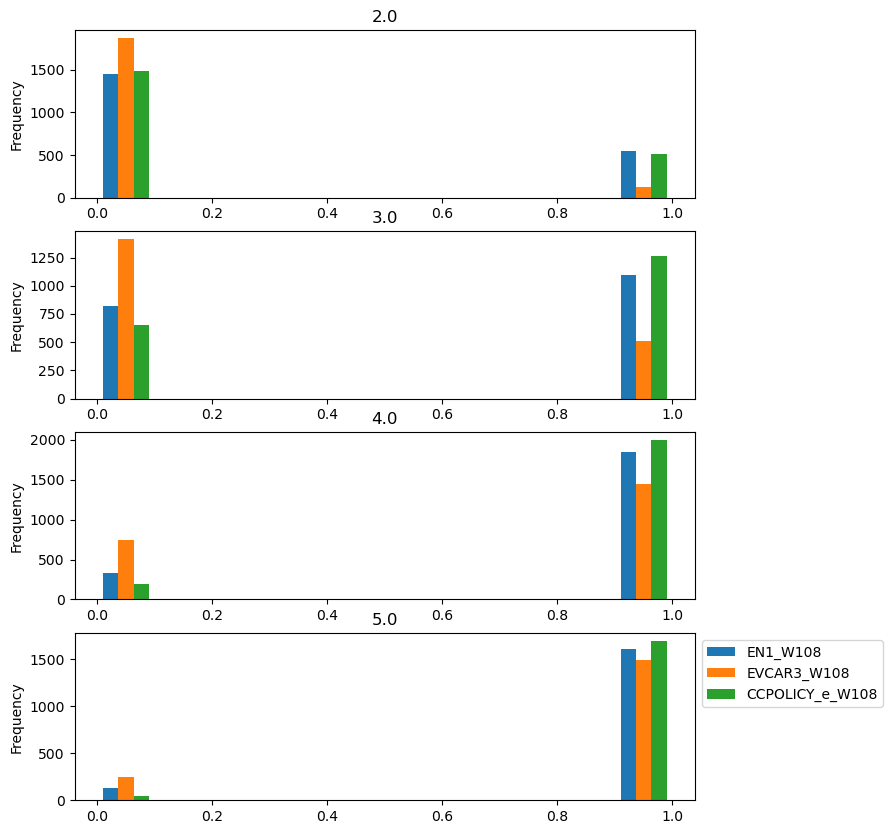

In [27]:
#EVCAR2_W108 asks how likely someone is to purchase an EV in the future.  
#The features with the highest correlations with EVCAR108 are EN1_W108 (i.e., developing alternative
#fuels is a priority), EVCAR3_W108 (i.e., favor or oppose
#phasing out gasoline cars).  These
#correspond well with the correlation coefficients previously shared. 

#plot histogram of correlation coefficients for EVCAR2_W108
subset_df.plot(kind='hist',column=['EN1_W108', 'EVCAR3_W108', 'CCPOLICY_e_W108']
                  , by="EVCAR2_W108",figsize=(8, 10),legend=False)
#place legend outside figure
plt.legend(bbox_to_anchor=(1.0, 1.0))

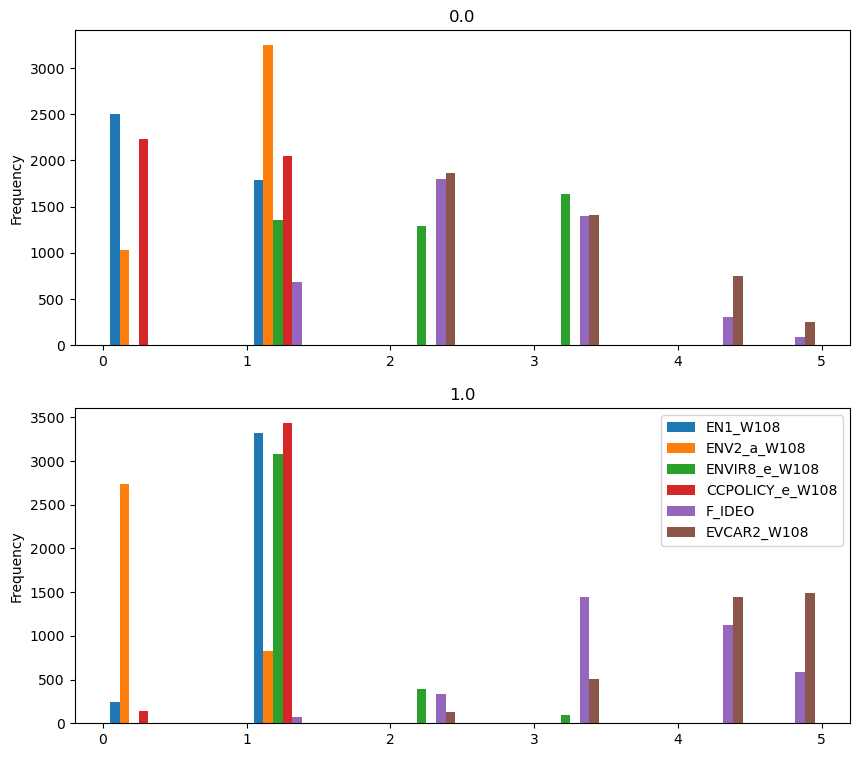

In [28]:
# EVCAR3_W108 asks whether someone favors phasing out production of gas car/trucks by 2035.
# ENV2_a_W108 and ENVIR8_e_W108 negatively correlate with EVCAR3_W108. 
# These people tend to be more support of NOT taking action to prevent climate change and
# offshore exploration for fossil fuels. 



#plot histogram of moderate correlations variables for EVCAR3_W108
subset_df.plot(kind='hist',column=['EN1_W108', 'ENV2_a_W108', 'ENVIR8_e_W108', 'CCPOLICY_e_W108','F_IDEO','EVCAR2_W108']
                  , by="EVCAR3_W108",figsize=(10, 9),legend=False)
#place legend outside figure
plt.legend(bbox_to_anchor=(1.0, 1.0))

In [29]:
#EVCAR1_W108 asks a respondent if they already own an EV.  The responses are so imbalanced (i.e.
#many more people NOT owning EVs), the feature did not correlate with anything.  


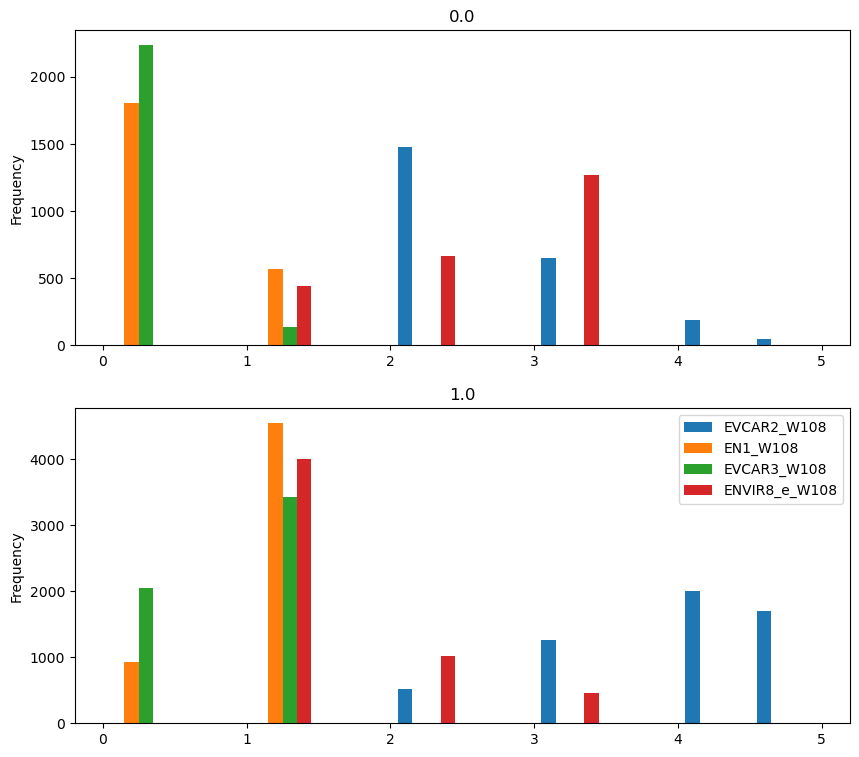

In [30]:

#CCPOLICY_e_W108 asks a respondent if they favor incentives to increase the use of EV and hybrid
#vehicles. 


#Those who oppose providing incentives are not likely to buy an EV (i.e., EVCAR2_W108).   
#Those who favor incentives favor the phasing out of gas vehicles (i.e., EVCAR3_W108), favor the development
#of alternative energy sources (EN1_W108), and feel that too little has been done to address climate change 
#(i.e., ENVIR8_e_W108)

#plot histogram of moderate correlations variables for CCPOLICY_e_W108 for values >0.4 & EVCAR2_W108
subset_df.plot(kind='hist',column=['EVCAR2_W108','EN1_W108','EVCAR3_W108', 
                                   'ENVIR8_e_W108']
                  , by="CCPOLICY_e_W108",figsize=(10, 9),legend=False,)
#place legend outside figure
plt.legend(bbox_to_anchor=(1.0, 1.0))

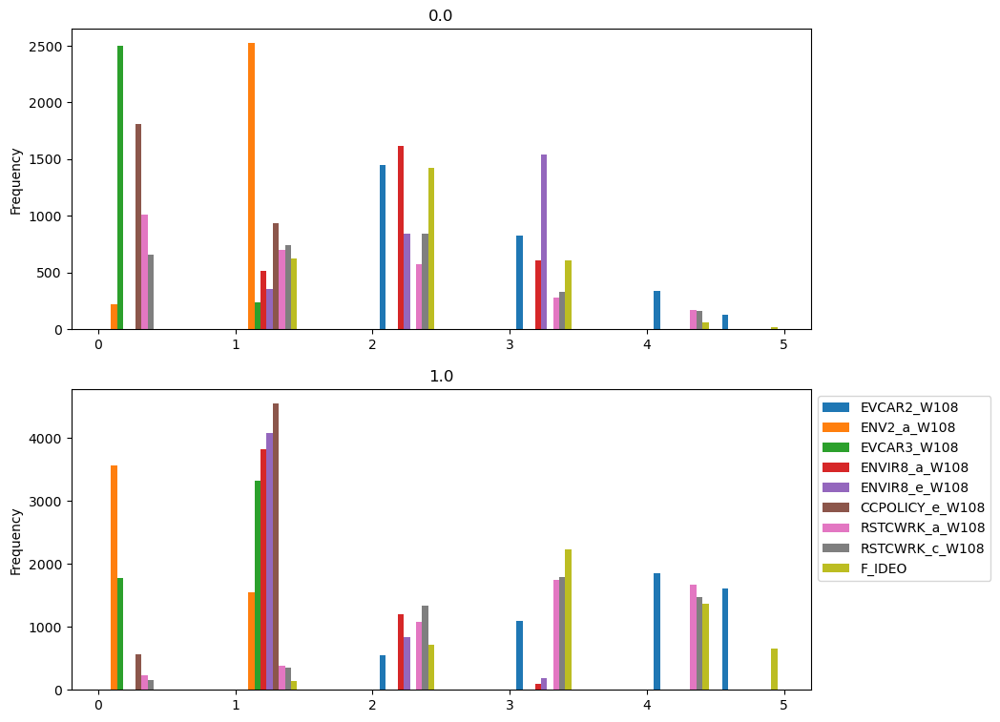

In [31]:
#EN1_W108 asks respondents if they think priority should be given to alternative energy sources or
#traditional fossil fuel exploration.

#Those who favor fossil fuel sources also tend to be more conservative (i.e., F_IDEO), strongly oppose 
#phasing out the production of new gas/trucks by 2035 (i.e., EVCAR3_W108), think that the 
#government is doing too much to reduce the effects of climate change (i.e., ENVIR8_e_W108), 
#and are less likely to buy an EV (EVCAR2_W108). 

#Those who favor clean energy sources tend to be less conservative/more liberal, 
#slightly more likely to buy an EV,feel that the government is not doing enough, and support the
#phasing out of gasoline vehicles.  They also don't support offshore drilling (ENV2_a_W108),  
#feeling the goverment is doing too little to protect air quality (ENVIR8_a_W108), that incentives
#should be provided for EVs (CCPOLICY_e_W108), and that people should wear masks around others when indoors
#(i.e., RSTCWRK_a_W108) and we should limit activities to protect others from COVID (i.e., RSTCWRK_e_W108)

#plot histogram of moderate correlations variables for EN1_W108 with correlation > 0.45 and EVCAR2_W108
subset_df.plot(kind='hist',column=['EVCAR2_W108','ENV2_a_W108', 'EVCAR3_W108', 'ENVIR8_a_W108',
                                   'ENVIR8_e_W108', 'CCPOLICY_e_W108','RSTCWRK_a_W108', 'RSTCWRK_c_W108',
                                   'F_IDEO']
                  , by="EN1_W108",figsize=(10, 9),legend=False,)
#place legend outside figure
plt.legend(bbox_to_anchor=(1.0, 1.0))

## Feature Interdependence:  VIF

The Variance Inflaction Factor is calculated to find multicollinearity among the selected features/independent
variables for our models.

In [32]:
#Identifying the features/independent variables for VIF

#Drop target variables EVCAR2_W108 and EN1_W108

X = EV_df_original_1B.drop(['QKEY', 'EVCAR2_W108', 'RSTCWRK_b_W108','F_AGECAT', 'ENV2_d_W108', 'RSTCWRK_d_W108', 'ENVIR8_a_W108',
                            'RSTCWRK_c_W108', 'F_EDUCCAT', 'RSTCWRK_a_W108', 'ENVIR8_e_W108','F_IDEO', 
                            'F_INTFREQ', 'F_RACETHNMOD_1.0', 'F_MARITAL_1.0', 'F_CREGION_2', 'F_MARITAL_5.0', 
                            'F_MARITAL_6.0', 'F_CREGION_1', 'F_MARITAL_2.0', 'F_MARITAL_3.0', 'F_CREGION_3', 
                            'F_CREGION_4','F_MARITAL_4.0']
                           ,axis=1)

X.columns.tolist()

['ENV2_a_W108',
 'ENV2_b_W108',
 'ENV2_f_W108',
 'EN1_W108',
 'EVCAR3_W108',
 'EVCAR1_W108',
 'LOCENV_a_W108',
 'LOCENV_d_W108',
 'LOCENV_e_W108',
 'ENVRMPCT_a_W108',
 'ENVRMPCT_b_W108',
 'ENVRMPCT_c_W108',
 'ENVRMPCT_d_W108',
 'ENVRMPCT_e_W108',
 'CCPOLICY_e_W108',
 'RSTCWRK_e_W108',
 'COVID_INFECT_a_W108',
 'COVID_INFECT_b_W108',
 'GAP21Q12_W108',
 'F_METRO',
 'F_GENDER',
 'F_PARTYSUM_FINAL',
 'F_INC_SDT1',
 'F_RACETHNMOD_2.0',
 'F_RACETHNMOD_3.0',
 'F_RACETHNMOD_4.0',
 'F_RACETHNMOD_5.0']

In [33]:
# Create a function to calculate VIF
from statsmodels.stats.outliers_influence import variance_inflation_factor

def calc_vif(X):
    vif = pd.DataFrame()
    vif["variables"] = X.columns
    vif["VIF"] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]

    return(vif)

In [34]:
# Calculate VIF for the dataframe's ordinal and binary data.  For our study, 
#a VIF value that exceeds 5 or 10 indicates a problematic amount of collinearity.

#Based on the VIF: We will be excluding the following features from our models:
# RSTCWRK_b_W108
# F_AGECAT
# ENV2_d_W108
# RSTCWRK_d_W108
# ENVIR8_a_W108
# RSTCWRK_c_W108
# F_EDUCCAT
# RSTCWRK_a_W108
# ENVIR8_e_W108
# F_IDEO
# F_INTFREQ
# F_RACETHNMOD_1.0
# F_MARITAL_1.0
# F_CREGION_2
# F_MARITAL_5.0
# F_MARITAL_6.0
# F_CREGION_1
# F_MARITAL_2.0
# F_MARITAL_3.0
# F_CREGION_3
# F_CREGION_4
# F_MARITAL_4.0
# EVCAR2_W108

calc_vif(X).sort_values("VIF")

,variables,VIF
25,F_RACETHNMOD_4.0,1.046702
26,F_RACETHNMOD_5.0,1.093659
5,EVCAR1_W108,1.183335
23,F_RACETHNMOD_2.0,1.212410
12,ENVRMPCT_d_W108,1.350550
24,F_RACETHNMOD_3.0,1.359154
13,ENVRMPCT_e_W108,1.744523
11,ENVRMPCT_c_W108,2.030833
20,F_GENDER,2.066682
9,ENVRMPCT_a_W108,2.083907


## Model Selection and Model Evaluation Metrics

1.) EVCAR2_W108 (i.e., asks how likely someone is to purchase an EV in the future) is our first target.

We chose EVCAR2_W108 as a target variable because it represents economic viability for EVs in the car industry. Also, it is balanced and though not normally distributed could be transformed. 

Model Selection - Gradient Boosting Regression:  Based on our EDA, we will explore gradient boosting regression to account for any non-linear relationships, imbalances in our features, and interdependence.  There is an added advantage of gradient boosting regression being robust against any outliers we may have overseen and we did not detect with boxplots.  Gradient boosting regression is a type of ensemble learning method where new models are added to correct the errors made by existing models - usually decision trees. As such, no scaling of the data is needed. Models are added sequentially until no further improvements can be made. The "gradient" in "gradient boosting" comes from the fact that the algorithm uses gradient descent to minimize the loss when adding new models.The key hyperparameters of Gradient Boosting Regression include the number of decision trees (controlled by the number of iterations), the depth of the decision trees, and the learning rate. These need to be tuned carefully to avoid overfitting

Features for inclusion based upon correlations and VIF during EDA:
 'ENV2_a_W108',
 'ENV2_b_W108',
 'ENV2_f_W108',
 'EN1_W108',
 'EVCAR3_W108',
 'EVCAR1_W108',
 'LOCENV_a_W108',
 'LOCENV_d_W108',
 'LOCENV_e_W108',
 'ENVRMPCT_a_W108',
 'ENVRMPCT_b_W108',
 'ENVRMPCT_c_W108',
 'ENVRMPCT_d_W108',
 'ENVRMPCT_e_W108',
 'CCPOLICY_e_W108',
 'RSTCWRK_e_W108',
 'COVID_INFECT_a_W108',
 'COVID_INFECT_b_W108',
 'GAP21Q12_W108',
 'F_METRO',
 'F_GENDER',
 'F_PARTYSUM_FINAL',
 'F_INC_SDT1',
 'F_RACETHNMOD_2.0',
 'F_RACETHNMOD_3.0',
 'F_RACETHNMOD_4.0',
 'F_RACETHNMOD_5.0'

Evaluation metrics: R2, Adjusted R2, MSE, RMSE


2.) EVCAR3_W108 (i.e., asks whether someone favors phasing out production of gas car/trucks by 2035) is our second (and, backup) target. It represents an outcome of interest because it directly impacts consumer choice (i.e., a future of only EV cars) and the energy sector. We chose EVCAR3_W108 as a target variable because it is balanced, and the features correlated with it are roughly normal.  

Model Selection - Classification Techniques:

Random Forest Classifier: 
-Our dataset has many features and we don't want to overfitting. 
-Handles imbalanced data
-Feature importance
-Bagging subsets of features
-Robust to missing values
-Versatile to different types of data 
-Do not need to scale data (decision trees are not affected by scale of data)
-Captures non-linear relationships

Support Vector Classification (SVC): 
-Our dataset has many features and we don't want to overfitting
-Versatile to high dimensionality
-Captures non-linear relationships
-Multiple kernal boundaries to choose from

K-Nearest Neighbors (KNN): 
-Intuitive and simple:  Based on proximity 
-Captures non-linear relationships
-Few hyperparameters
-Visual output of the accuracy

Features for inclusion based upon correlations and VIF during EDA: 
 'EVCAR2_W108'
 'ENV2_a_W108',
 'ENV2_b_W108',
 'ENV2_f_W108',
 'EN1_W108',
 'EVCAR3_W108',
 'EVCAR1_W108',
 'LOCENV_a_W108',
 'LOCENV_d_W108',
 'LOCENV_e_W108',
 'ENVRMPCT_a_W108',
 'ENVRMPCT_b_W108',
 'ENVRMPCT_c_W108',
 'ENVRMPCT_d_W108',
 'ENVRMPCT_e_W108',
 'CCPOLICY_e_W108',
 'RSTCWRK_e_W108',
 'COVID_INFECT_a_W108',
 'COVID_INFECT_b_W108',
 'GAP21Q12_W108',
 'F_METRO',
 'F_GENDER',
 'F_PARTYSUM_FINAL',
 'F_INC_SDT1',
 'F_RACETHNMOD_2.0',
 'F_RACETHNMOD_3.0',
 'F_RACETHNMOD_4.0',
 'F_RACETHNMOD_5.0'

Evaluation metrics: 
-Classification report
-Balanced accuracy to account for imbalanced data
-AUC ROC Curve


Based on our EDA, we proposed the following models and evaluation metrics for our analyses.  
Given our secondary research and the recent popular press emphasis on the decline in popularity of
EV vehicles, we opted for evaulation metrics that balance sensitivity and precision. That is, we do not want to turn away any customers who would buy an EV but were assumed not to (False Negative - missed sale) or miss out on opportunities that may seem wasteful but are fairly economical (i.e., research, ads, word-of-mouth, test drives, demonstrations, etc...). 



# Data Implementation:  Supervised Learning: Gradient Boosting Regression
## Answering, "Why?"
## Analyses to help answer and predict why consumers intend to purchase an electric vehicle/EV

In [35]:
# Define features and target variable
features = ['ENV2_a_W108', 'ENV2_b_W108', 'ENV2_f_W108', 'EN1_W108', 'EVCAR3_W108', 'EVCAR1_W108', 'LOCENV_a_W108', 'LOCENV_d_W108', 'LOCENV_e_W108', 'ENVRMPCT_a_W108', 'ENVRMPCT_b_W108', 'ENVRMPCT_c_W108', 'ENVRMPCT_d_W108', 'ENVRMPCT_e_W108', 'CCPOLICY_e_W108', 'RSTCWRK_e_W108', 'COVID_INFECT_a_W108', 'COVID_INFECT_b_W108', 'GAP21Q12_W108', 'F_METRO', 'F_GENDER', 'F_PARTYSUM_FINAL', 'F_INC_SDT1', 'F_RACETHNMOD_2.0', 'F_RACETHNMOD_3.0', 'F_RACETHNMOD_4.0', 'F_RACETHNMOD_5.0']
target = 'EVCAR2_W108'

In [36]:
# Split your data
X = EV_df_original_1B[features]
y = EV_df_original_1B[target]
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [37]:
# Initialize and fit the model
model = GradientBoostingRegressor(random_state=42)
model.fit(X_train, y_train)

# Make predictions
y_pred = model.predict(X_test)

In [38]:
# Calculate and print the evaluation metrics
mse = mean_squared_error(y_test, y_pred)
mae = mean_absolute_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

# Adjusted R^2
n = X_test.shape[0]
p = X_test.shape[1]
adjusted_r2 = 1-(1-r2)*(n-1)/(n-p-1)

print(f"Mean Squared Error (MSE): {mse}")
print(f"Mean Absolute Error (MAE): {mae}")
print(f"R^2 Score: {r2}")
print(f"Adjusted R^2 Score: {adjusted_r2}")

Mean Squared Error (MSE): 0.5984446766901906
Mean Absolute Error (MAE): 0.6167593763772717
R^2 Score: 0.5135072696322278
Adjusted R^2 Score: 0.5049889144312356


# Data Model Evaluation and Optimization:  Supervised Learning: Gradient Boosting Regression
## Analyses to assess various iterations of model performance

In [39]:
#For social science research an adjusted R squared/coefficient of determination of 50% 
#is fairly high (Online at https://mpra.ub.uni-muenchen.de/115769/
#MPRA Paper No. 115769, posted 26 Dec 2022 14:32 UTC).  However, we used RandomizedSearchCV
#to tune our model as it was not as computationally time consuming as GridSearchCV.  However, the best
#parameters did not improve our adjusted R squared/coefficient of determination.  

# Define the hyperparameters
param_distributions = {
    'n_estimators': [100, 200, 300],
    'max_depth': [None, 2, 3, 4],
    'min_samples_split': [2, 3, 4],
    'learning_rate': [0.01, 0.1, 0.2],
    'subsample': [0.5, 0.7, 1.0],
    'loss': ['ls', 'lad', 'huber']
}

# Initialize the model
model = GradientBoostingRegressor(random_state=42)

# Initialize the Randomized Search
randomized_search = RandomizedSearchCV(estimator=model, param_distributions=param_distributions, cv=3, scoring='neg_mean_squared_error', verbose=2, n_jobs=-1, random_state=42)

# Fit the Randomized Search
randomized_search.fit(X_train, y_train)

# Get the best parameters
best_params = randomized_search.best_params_
print("Best parameters found: ", best_params)

# Fit the model with the best parameters
model = GradientBoostingRegressor(**best_params, random_state=42)
model.fit(X_train, y_train)

# Make predictions
y_pred = model.predict(X_test)

# Calculate and print the evaluation metrics
mse = mean_squared_error(y_test, y_pred)
mae = mean_absolute_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

# Adjusted R^2
n = X_test.shape[0]
p = X_test.shape[1]
adjusted_r2 = 1-(1-r2)*(n-1)/(n-p-1)

print(f"Mean Squared Error (MSE): {mse}")
print(f"Mean Absolute Error (MAE): {mae}")
print(f"R^2 Score: {r2}")
print(f"Adjusted R^2 Score: {adjusted_r2}")

Fitting 3 folds for each of 10 candidates, totalling 30 fits
Best parameters found:  {'subsample': 0.7, 'n_estimators': 300, 'min_samples_split': 2, 'max_depth': 3, 'loss': 'huber', 'learning_rate': 0.01}
Mean Squared Error (MSE): 0.6087538217681637
Mean Absolute Error (MAE): 0.6360242039980607
R^2 Score: 0.505126671839164
Adjusted R^2 Score: 0.4964615746534684


                feature  importance
4           EVCAR3_W108    0.489199
14      CCPOLICY_e_W108    0.327813
3              EN1_W108    0.058148
5           EVCAR1_W108    0.043311
0           ENV2_a_W108    0.016847
21     F_PARTYSUM_FINAL    0.012706
22           F_INC_SDT1    0.010323
6         LOCENV_a_W108    0.007773
16  COVID_INFECT_a_W108    0.007272
19              F_METRO    0.004100
2           ENV2_f_W108    0.003927
10      ENVRMPCT_b_W108    0.003408
7         LOCENV_d_W108    0.003123
8         LOCENV_e_W108    0.001734
15       RSTCWRK_e_W108    0.001703
26     F_RACETHNMOD_5.0    0.001659
18        GAP21Q12_W108    0.001450
1           ENV2_b_W108    0.001316
17  COVID_INFECT_b_W108    0.001015
9       ENVRMPCT_a_W108    0.000956
24     F_RACETHNMOD_3.0    0.000558
11      ENVRMPCT_c_W108    0.000480
20             F_GENDER    0.000416
13      ENVRMPCT_e_W108    0.000328
12      ENVRMPCT_d_W108    0.000216
23     F_RACETHNMOD_2.0    0.000193
25     F_RACETHNMOD_4.0    0

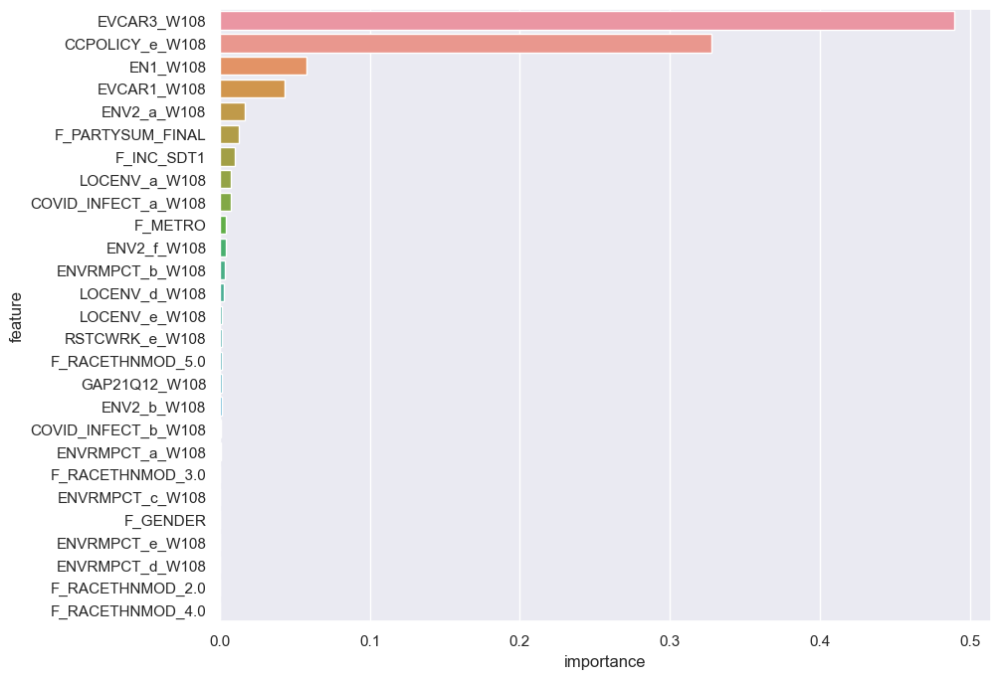

In [40]:
#Finding feature importance.  EVCAR3_W108 (i.e., favor or oppose the phasing out of production of gasoline
#cars) and CCPOLICY_e_W108 (i.e., oppose or favor the incentives to increase the use of EVs) 
#predict most of the target EVCAR2_108 (Likelihood of buying an EV in the future). 

# Feature importance instance
feature_importance = model.feature_importances_

# Create a DataFrame of feature importances
feature_importance_df = pd.DataFrame({'feature': features, 'importance': feature_importance})

# Sort the DataFrame by importance in descending order
feature_importance_df = feature_importance_df.sort_values('importance', ascending=False)

print(feature_importance_df)

#Plot
# Set the aesthetics using Seaborn
sns.set()

# Create a bar chart
plt.figure(figsize=(10, 8))
sns.barplot(x='importance', y='feature', data=feature_importance_df)

# Display the plot
plt.show()


# Data Implementation:  Supervised Learning: Random Forest Classifier
## Answering, "Why?"
## Analyses to help classify whether consumers favor or oppose phasing out production of gas car/trucks by 2035

In [49]:
#Define features and target

features = ['ENV2_a_W108', 'ENV2_b_W108', 'ENV2_f_W108', 'EN1_W108', 'EVCAR2_W108', 'EVCAR1_W108', 'LOCENV_a_W108', 'LOCENV_d_W108', 'LOCENV_e_W108', 'ENVRMPCT_a_W108', 'ENVRMPCT_b_W108', 'ENVRMPCT_c_W108', 'ENVRMPCT_d_W108', 'ENVRMPCT_e_W108', 'CCPOLICY_e_W108', 'RSTCWRK_e_W108', 'COVID_INFECT_a_W108', 'COVID_INFECT_b_W108', 'GAP21Q12_W108', 'F_METRO', 'F_GENDER', 'F_PARTYSUM_FINAL', 'F_INC_SDT1', 'F_RACETHNMOD_2.0', 'F_RACETHNMOD_3.0', 'F_RACETHNMOD_4.0', 'F_RACETHNMOD_5.0']
target = 'EVCAR3_W108'
X = EV_df_original_1B[features]
y = EV_df_original_1B[target]



In [50]:
#Split data in training and testing sets

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [51]:
#Train the RFC:
clf = RandomForestClassifier(random_state=42)
clf.fit(X_train, y_train)

RandomForestClassifier(random_state=42)

In [52]:
#Find y_predict

y_pred = clf.predict(X_test)

# Data Model Evaluation and Optimization:  Supervised Learning: Random Forest Classifier
## Analyses to assess various iterations of model performance

Accuracy: 0.8312101910828026
Balanced Accuracy: 0.8298467075643171
              precision    recall  f1-score   support

         0.0       0.85      0.84      0.85       863
         1.0       0.81      0.82      0.81       707

    accuracy                           0.83      1570
   macro avg       0.83      0.83      0.83      1570
weighted avg       0.83      0.83      0.83      1570



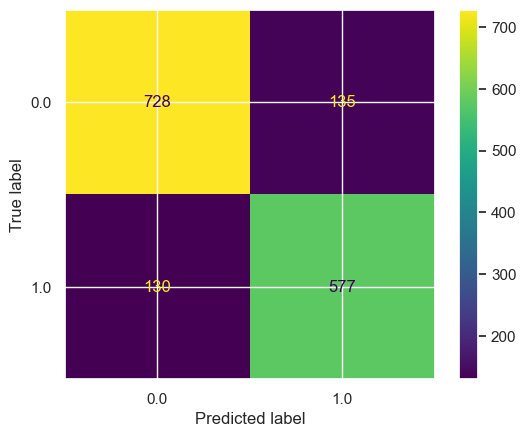

ROC AUC: 0.9091095336979486


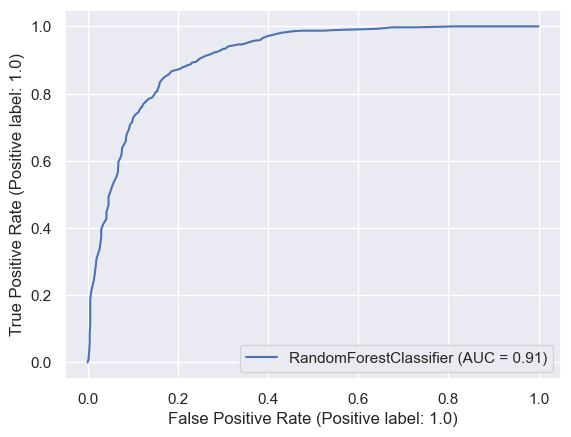

In [53]:
#RFC evaluation metrics

#Overall, accuracy scores for the RFC model are high and do not suggest need for optimization at this time.

#ROC AUC stands for "Receiver Operating Characteristic - Area Under Curve".  Our AUC is 0.90.
#This suggests that our RFC model does a good job of distinguishing between favor and opposition
#to the phasing out of gas-fueled cars by 2035. Our other evaluation metrics corroborate the 
#findngs of the ROC AUC. 

#Accuracy score
accuracy = accuracy_score(y_test, y_pred)
print(f"Accuracy: {accuracy}")

#Balanced accuracy score
balanced_accuracy = balanced_accuracy_score(y_test, y_pred)
print(f"Balanced Accuracy: {balanced_accuracy}")

#Classification report
print(classification_report(y_test, y_pred))

#Confusion matrix and display of it
cm = confusion_matrix(y_test, y_pred)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=clf.classes_)
disp.plot()
plt.show()

#ROC Curve and AUC
# Compute probabilities of the positive class
y_pred_proba = clf.predict_proba(X_test)[:, 1]

fpr, tpr, _ = roc_curve(y_test, y_pred_proba)
roc_auc = auc(fpr, tpr)

print(f"ROC AUC: {roc_auc}")

RocCurveDisplay.from_estimator(clf, X_test, y_test)

In [ ]:
#Feature importance

# Get feature importances
importances = clf.feature_importances_

# Create a DataFrame to display feature importances
importance_df = pd.DataFrame({
    'Feature': features,
    'Importance': importances
})

# Sort the DataFrame by importance in descending order
importance_df = importance_df.sort_values(by='Importance', ascending=False)

print(importance_df)

#Plot
#Set the aesthetics using Seaborn
sns.set()

# Create a bar chart
plt.figure(figsize=(10, 8))
sns.barplot(x='Importance', y='Feature', data=importance_df)

# Display the plot
plt.show()


# Data Implementation:  Supervised Learning: Support Vector Classification
## Answering "Why?"
## Analyses to help classify whether consumers favor or oppose phasing out production of gas car/trucks by 2035

In [54]:
#Define features and target

features = ['ENV2_a_W108', 'ENV2_b_W108', 'ENV2_f_W108', 'EN1_W108', 'EVCAR2_W108', 'EVCAR1_W108', 'LOCENV_a_W108', 'LOCENV_d_W108', 'LOCENV_e_W108', 'ENVRMPCT_a_W108', 'ENVRMPCT_b_W108', 'ENVRMPCT_c_W108', 'ENVRMPCT_d_W108', 'ENVRMPCT_e_W108', 'CCPOLICY_e_W108', 'RSTCWRK_e_W108', 'COVID_INFECT_a_W108', 'COVID_INFECT_b_W108', 'GAP21Q12_W108', 'F_METRO', 'F_GENDER', 'F_PARTYSUM_FINAL', 'F_INC_SDT1', 'F_RACETHNMOD_2.0', 'F_RACETHNMOD_3.0', 'F_RACETHNMOD_4.0', 'F_RACETHNMOD_5.0']
target = 'EVCAR3_W108'
X = EV_df_original_1B[features]
y = EV_df_original_1B[target]

In [55]:
# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [56]:
# StandardScaler:  Standarize the features to have mean=0 and variance=1
scaler = StandardScaler().fit(X_train)
X_train_scaled = scaler.transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Data Model Evaluation and Optimization:  Supervised Learning:  Support Vector Classification
## Analyses to assess various iterations of model performance

In [57]:
# Train the SVC with multiple kernels

kernels = [ 'sigmoid','linear', 'poly', 'rbf']


for kernel in kernels:
    # Train the SVC
    svc = SVC(kernel=kernel)
    svc.fit(X_train_scaled, y_train)
    
    # Predict on the test set
    y_pred = svc.predict(X_test_scaled)
    
    # Calculate and print the accuracy
    accuracy = svc.score(X_test_scaled, y_test)
    print(f"Accuracy with {kernel} kernel: {accuracy}")

  

Accuracy with sigmoid kernel: 0.7910828025477707
Accuracy with linear kernel: 0.8312101910828026
Accuracy with poly kernel: 0.8197452229299363
Accuracy with rbf kernel: 0.8363057324840765


In [ ]:
#We opted not to optimize the SVC given its poorer performance to RFC.

# Data Implementation:  Supervised Learning: K-Nearest Neighbors Classification 

## Answering "Why?"
## Analyses to help classify whether consumers favor or oppose phasing out production of gas car/trucks by 2035

In [60]:
#Define the features and target
features = ['ENV2_a_W108', 'ENV2_b_W108', 'ENV2_f_W108', 'EN1_W108', 'EVCAR2_W108', 'EVCAR1_W108', 'LOCENV_a_W108', 'LOCENV_d_W108', 'LOCENV_e_W108', 'ENVRMPCT_a_W108', 'ENVRMPCT_b_W108', 'ENVRMPCT_c_W108', 'ENVRMPCT_d_W108', 'ENVRMPCT_e_W108', 'CCPOLICY_e_W108', 'RSTCWRK_e_W108', 'COVID_INFECT_a_W108', 'COVID_INFECT_b_W108', 'GAP21Q12_W108', 'F_METRO', 'F_GENDER', 'F_PARTYSUM_FINAL', 'F_INC_SDT1', 'F_RACETHNMOD_2.0', 'F_RACETHNMOD_3.0', 'F_RACETHNMOD_4.0', 'F_RACETHNMOD_5.0']
target = 'EVCAR3_W108'
X = EV_df_original_1B[features]
y = EV_df_original_1B[target]

In [61]:
# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [62]:
# StandardScaler and fit to the training data
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)

In [63]:
# Transform the testing data with the standard scaler
X_test = scaler.transform(X_test)

k: 1, Train/Test Score: 1.000/0.759
k: 3, Train/Test Score: 0.882/0.800
k: 5, Train/Test Score: 0.855/0.817
k: 7, Train/Test Score: 0.849/0.813
k: 9, Train/Test Score: 0.841/0.820
k: 11, Train/Test Score: 0.837/0.813
k: 13, Train/Test Score: 0.837/0.814
k: 15, Train/Test Score: 0.834/0.811
k: 17, Train/Test Score: 0.831/0.817
k: 19, Train/Test Score: 0.829/0.815


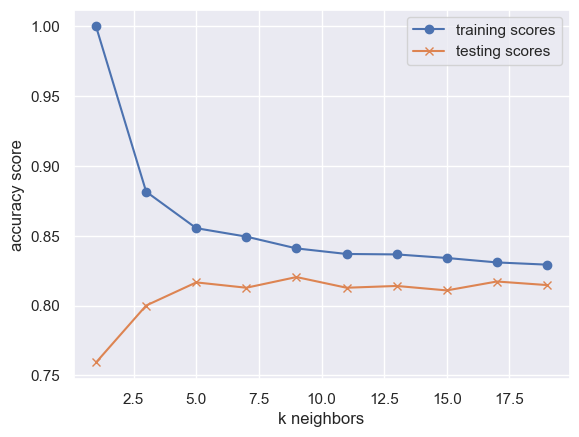

In [65]:
# Loop through different k values to find which has the highest accuracy.
# Note: We use only odd numbers because we don't want any ties.
train_scores = []
test_scores = []
for k in range(1, 20, 2):
    knn = KNeighborsClassifier(n_neighbors=k)
    knn.fit(X_train_scaled, y_train)
    train_score = knn.score(X_train_scaled, y_train)
    test_score = knn.score(X_test_scaled, y_test)
    train_scores.append(train_score)
    test_scores.append(test_score)
    print(f"k: {k}, Train/Test Score: {train_score:.3f}/{test_score:.3f}")
    
# Plot the results
plt.plot(range(1, 20, 2), train_scores, marker='o', label="training scores")
plt.plot(range(1, 20, 2), test_scores, marker="x", label="testing scores")
plt.xlabel("k neighbors")
plt.ylabel("accuracy score")
plt.legend()
plt.show()


In [ ]:
# Choose the best k, and refit the KNN classifier by using that k value.
# Note that k: 9 provides the best accuracy where the classifier starts to stablize
knn = KNeighborsClassifier(n_neighbors=9)
knn.fit(X_train_scaled, y_train)

# Print the score for the test data.
print('k=9 Test Acc: %.3f' % knn.score(X_test_scaled, y_test))

# Data Model Evaluation and Optimization:  K-Nearest Neighbors Classification

## Analyses to assess various iterations of model performance

k=9 Test Acc: 0.815
k=9 Test Balanced Acc: 0.820
Confusion matrix:
 [[659 204]
 [ 87 620]]


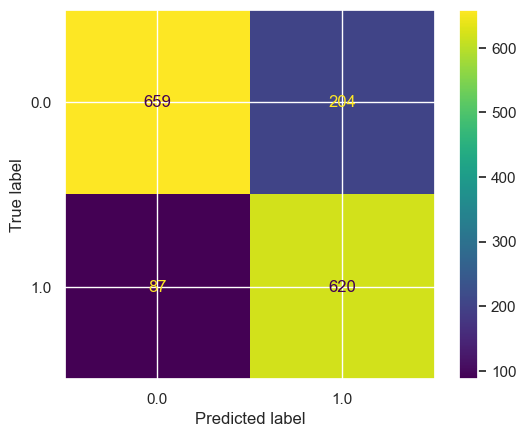

ROC AUC: 0.8915398244012449


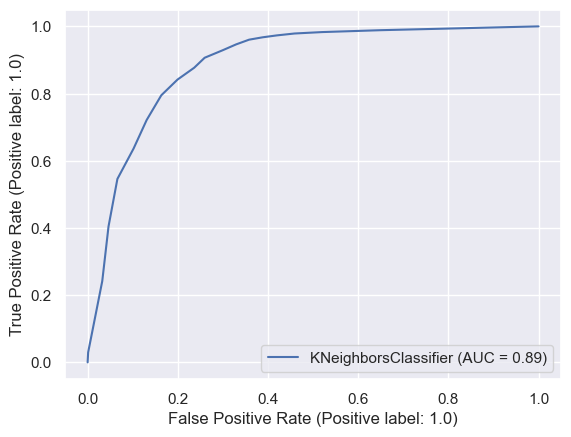

In [69]:
# Accuracy
accuracy = knn.score(X_test_scaled, y_test)
print(f'k=9 Test Acc: {accuracy:.3f}')

# Balanced Accuracy
y_pred = knn.predict(X_test_scaled)
balanced_accuracy = balanced_accuracy_score(y_test, y_pred)
print(f'k=9 Test Balanced Acc: {balanced_accuracy:.3f}')

# Confusion Matrix (Classification Table)
confusion_mat = confusion_matrix(y_test, y_pred)
print('Confusion matrix:\n', confusion_mat)

#Confusion matrix and display of it
cm = confusion_matrix(y_test, y_pred)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=knn.classes_)
disp.plot()
plt.show()

#ROC Curve and AUC
# Compute probabilities of the positive class
y_pred_proba = knn.predict_proba(X_test)[:, 1]

fpr, tpr, _ = roc_curve(y_test, y_pred_proba)
roc_auc = auc(fpr, tpr)

print(f"ROC AUC: {roc_auc}")

RocCurveDisplay.from_estimator(knn, X_test, y_test)

In [ ]:
#We opted not to optimize the K-nearest neighbors classification given RFC had higher accuracy. 

# Data Implementation:  Unsupervised Learning
## Who?  
## Principal components analysis and cluster analysis are used to refine our understanding of who intends to purchase an electric vehicle/EV


# Data Model Evaluation and Optimization:  Unsupervised Learning
## Analyses to assess various iterations of model performance